In [2]:
import pandas as pd
import csv
import folium

charging = pd.read_csv(
    '한국환경공단_전기차 충전소 위치 및 운영 정보_20240708.csv',
    engine='python',
    encoding='cp949',
    on_bad_lines='skip'
)

apartments = pd.read_excel('20251128_단지_기본정보.xlsx')


C:\Users\jeong\anaconda3\Lib\site-packages\openpyxl\styles\stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


In [3]:
with open('읍면동별 세대 및 인구_20251029143945.csv', 'r', encoding='utf-8') as f:
    rows = list(csv.reader(f))

dongs = rows[2][:-2]
nums = rows[4]

records = []
for i, name in enumerate(dongs):
    base = i * 4
    households = nums[base + 2]
    population = nums[base + 3]
    records.append({
        'dong': name,
        'households': int(households.replace(',', '')),
        'population': int(population.replace(',', ''))
    })

population = pd.DataFrame(records)
population.head()


,dong,households,population
0,연기면,6182,20510
1,연동면,1864,1423
2,부강면,94,1594
3,금남면,197,3039
4,장군면,336,4648


In [4]:
charging_sejong = charging[charging['시도'].str.contains('세종', na=False)].copy()

charging_sejong[['lat', 'lng']] = charging_sejong['위도경도'].str.split(',', expand=True)
charging_sejong['lat'] = charging_sejong['lat'].astype(float)
charging_sejong['lng'] = charging_sejong['lng'].astype(float)

charging_sejong = charging_sejong[[
    '설치년도','시도','군구','주소',
    '충전소명','시설구분(대)','시설구분(소)',
    '급속충전량','충전기타입','lat','lng'
]]

charging_sejong.head()


,설치년도,시도,군구,주소,충전소명,시설구분(대),시설구분(소),급속충전량,충전기타입,lat,lng
828,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC차데모+AC3상+DC콤보,36.500276,127.269187
829,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC콤보,36.500276,127.269187
830,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC콤보,36.500276,127.269187
1148,2018,세종특별자치시,세종특별자치시,"세종특별자치시 연기면 정안세종로 1527 은하수공원, 화장시설 주차장",은하수공원,공공시설,지자체시설,급속(50kW),DC차데모+AC3상+DC콤보,36.532123,127.245097
1149,2018,세종특별자치시,세종특별자치시,"세종특별자치시 연기면 정안세종로 1527 은하수공원, 화장시설 주차장",은하수공원,공공시설,지자체시설,급속(100kW동시),DC콤보,36.532123,127.245097


In [5]:
apt_raw = apartments.copy()
new_header = apt_raw.iloc[0]
apt = apt_raw[1:].copy()
apt.columns = new_header

apt_sejong = apt[apt['시도'].str.contains('세종', na=False)].copy()

# 🔹 세대수: 문자열 → 숫자(정수)로 안전하게 변환
if '세대수' in apt_sejong.columns:
    s = (
        apt_sejong['세대수']
        .astype(str)
        .str.replace(',', '', regex=False)   # 천 단위 콤마 제거
        .str.replace('-', '0', regex=False)  # '-' 같은 값은 0 처리
    )

    # 숫자로 변환 (못 바꾸는 값은 NaN으로)
    s = pd.to_numeric(s, errors='coerce').fillna(0)

    # 최종적으로 int로
    apt_sejong['세대수'] = s.astype(int)

apt_sejong[['시도','시군구','단지명','법정동주소','도로명주소','세대수']].head()


,시도,시군구,단지명,법정동주소,도로명주소,세대수
8835,세종특별자치시,NaN,세종 펠리스,세종특별자치시 반곡동 4121-1002 세종 펠리스,세종특별자치시 한누리대로 1940,170
8836,세종특별자치시,NaN,수루배마을1단지아파트,세종특별자치시 반곡동 수루배마을1단지아파트,세종특별자치시 반곡로 14,1111
8837,세종특별자치시,NaN,수루배마을2단지아파트,세종특별자치시 반곡동 수루배마을2단지아파트,세종특별자치시 반곡1길 9,592
8838,세종특별자치시,NaN,수루배마을3단지,세종특별자치시 반곡동 수루배마을3단지,세종특별자치시 반곡로 15,784
8839,세종특별자치시,NaN,수루배마을4단지,세종특별자치시 반곡동 59-7 수루배마을4단지,세종특별자치시 시청대로 500,1092


In [6]:
# 세종시만 필터링
charging_sejong = charging[charging['시도'].str.contains('세종', na=False)].copy()

# 위도경도 분리 ("37.53...,126.83..." → lat/lng)
charging_sejong[['lat', 'lng']] = charging_sejong['위도경도'].str.split(',', expand=True)

# 숫자로 변환
charging_sejong['lat'] = charging_sejong['lat'].astype(float)
charging_sejong['lng'] = charging_sejong['lng'].astype(float)

# 필요한 컬럼만 남기기
charging_sejong = charging_sejong[[
    '설치년도','시도','군구','주소',
    '충전소명','시설구분(대)','시설구분(소)',
    '급속충전량','충전기타입','lat','lng'
]]

charging_sejong.head()
len(charging_sejong)


4639

In [7]:
charging.columns

Index(['설치년도', '시도', '군구', '주소', '충전소명', '시설구분(대)', '시설구분(소)', '기종(대)',
       '기종(소)', '운영기관(대)', '운영기관(소)', '급속충전량', '충전기타입', '이용자제한', '위도경도'],
      dtype='object')

In [8]:
import pandas as pd

# 1) lat/lng를 숫자로 강제 변환 (문자·공백·이상한 값 → NaN)
charging_sejong['lat'] = pd.to_numeric(charging_sejong['lat'], errors='coerce')
charging_sejong['lng'] = pd.to_numeric(charging_sejong['lng'], errors='coerce')

print("NaN 개수 (정제 전)")
print(charging_sejong[['lat', 'lng']].isna().sum())

# 2) lat 또는 lng 가 NaN 인 행 삭제
charging_sejong = charging_sejong.dropna(subset=['lat', 'lng'])

print("\n정제 후 충전소 개수 :", len(charging_sejong))
charging_sejong.head()


NaN 개수 (정제 전)
lat    48
lng    48
dtype: int64

정제 후 충전소 개수 : 4591


,설치년도,시도,군구,주소,충전소명,시설구분(대),시설구분(소),급속충전량,충전기타입,lat,lng
828,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC차데모+AC3상+DC콤보,36.500276,127.269187
829,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC콤보,36.500276,127.269187
830,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC콤보,36.500276,127.269187
1148,2018,세종특별자치시,세종특별자치시,"세종특별자치시 연기면 정안세종로 1527 은하수공원, 화장시설 주차장",은하수공원,공공시설,지자체시설,급속(50kW),DC차데모+AC3상+DC콤보,36.532123,127.245097
1149,2018,세종특별자치시,세종특별자치시,"세종특별자치시 연기면 정안세종로 1527 은하수공원, 화장시설 주차장",은하수공원,공공시설,지자체시설,급속(100kW동시),DC콤보,36.532123,127.245097


In [9]:
import folium

center_lat = charging_sejong['lat'].mean()
center_lng = charging_sejong['lng'].mean()

m = folium.Map(location=[center_lat, center_lng], zoom_start=12)

for _, row in charging_sejong.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=row['충전소명'],
        tooltip=row['주소'],
        icon=folium.Icon(color="blue", icon="bolt")
    ).add_to(m)

m


In [10]:
import pandas as pd

# lat/lng를 숫자로 강제 변환 (이상한 값은 NaN으로)
charging_sejong['lat'] = pd.to_numeric(charging_sejong['lat'], errors='coerce')
charging_sejong['lng'] = pd.to_numeric(charging_sejong['lng'], errors='coerce')

print("정제 전 행 개수 :", len(charging_sejong))

# lat 또는 lng가 NaN인 행 삭제
charging_sejong = charging_sejong.dropna(subset=['lat', 'lng'])

print("정제 후 행 개수 :", len(charging_sejong))

charging_sejong.head()


정제 전 행 개수 : 4591
정제 후 행 개수 : 4591


,설치년도,시도,군구,주소,충전소명,시설구분(대),시설구분(소),급속충전량,충전기타입,lat,lng
828,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC차데모+AC3상+DC콤보,36.500276,127.269187
829,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC콤보,36.500276,127.269187
830,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC콤보,36.500276,127.269187
1148,2018,세종특별자치시,세종특별자치시,"세종특별자치시 연기면 정안세종로 1527 은하수공원, 화장시설 주차장",은하수공원,공공시설,지자체시설,급속(50kW),DC차데모+AC3상+DC콤보,36.532123,127.245097
1149,2018,세종특별자치시,세종특별자치시,"세종특별자치시 연기면 정안세종로 1527 은하수공원, 화장시설 주차장",은하수공원,공공시설,지자체시설,급속(100kW동시),DC콤보,36.532123,127.245097


In [11]:
# 세종시 데이터만 필터링
charging_sejong = charging[charging['시도'].str.contains('세종', na=False)].copy()

print("전체 충전소 개수 :", len(charging))
print("세종 충전소 개수 :", len(charging_sejong))

# '위도경도'를 'lat', 'lng'로 분리
charging_sejong[['lat', 'lng']] = charging_sejong['위도경도'].str.split(',', expand=True)

# 숫자형으로 변환
charging_sejong['lat'] = charging_sejong['lat'].astype(float)
charging_sejong['lng'] = charging_sejong['lng'].astype(float)

# 필요한 컬럼만 남기기 (원하면 더 줄여도 됨)
charging_sejong = charging_sejong[[
    '설치년도', '시도', '군구', '주소',
    '충전소명', '시설구분(대)', '시설구분(소)',
    '급속충전량', '충전기타입',
    'lat', 'lng'
]]

charging_sejong.head()


전체 충전소 개수 : 361163
세종 충전소 개수 : 4639


,설치년도,시도,군구,주소,충전소명,시설구분(대),시설구분(소),급속충전량,충전기타입,lat,lng
828,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC차데모+AC3상+DC콤보,36.500276,127.269187
829,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC콤보,36.500276,127.269187
830,2018,세종특별자치시,세종특별자치시,"세종특별자치시 어진동 621, 입구 우측",세종호수공원제2주차장,주차시설,공영주차장,급속(100kW동시),DC콤보,36.500276,127.269187
1148,2018,세종특별자치시,세종특별자치시,"세종특별자치시 연기면 정안세종로 1527 은하수공원, 화장시설 주차장",은하수공원,공공시설,지자체시설,급속(50kW),DC차데모+AC3상+DC콤보,36.532123,127.245097
1149,2018,세종특별자치시,세종특별자치시,"세종특별자치시 연기면 정안세종로 1527 은하수공원, 화장시설 주차장",은하수공원,공공시설,지자체시설,급속(100kW동시),DC콤보,36.532123,127.245097


In [12]:
dong_list = population['dong'].tolist()
dong_list

['연기면',
 '연동면',
 '부강면',
 '금남면',
 '장군면',
 '연서면',
 '전의면',
 '전동면',
 '소정면',
 '한솔동',
 '새롬동',
 '도담동',
 '나성동',
 '해밀동',
 '어진동',
 '아름동',
 '종촌동',
 '고운동',
 '소담동',
 '반곡동',
 '보람동',
 '대평동',
 '다정동']

In [13]:
def find_dong_in_address(addr):
    if not isinstance(addr, str):
        return None
    for name in dong_list:
        if name in addr:
            return name
    return None

In [14]:
charging_sejong['dong'] = charging_sejong['주소'].apply(find_dong_in_address)
charging_sejong[['주소', 'dong']].head()

,주소,dong
828,"세종특별자치시 어진동 621, 입구 우측",어진동
829,"세종특별자치시 어진동 621, 입구 우측",어진동
830,"세종특별자치시 어진동 621, 입구 우측",어진동
1148,"세종특별자치시 연기면 정안세종로 1527 은하수공원, 화장시설 주차장",연기면
1149,"세종특별자치시 연기면 정안세종로 1527 은하수공원, 화장시설 주차장",연기면


In [15]:
apt_sejong['법정동주소'] = apt_sejong['법정동주소'].astype(str)
apt_sejong['dong'] = apt_sejong['법정동주소'].apply(find_dong_in_address)
apt_sejong[['법정동주소', 'dong', '세대수']].head()

,법정동주소,dong,세대수
8835,세종특별자치시 반곡동 4121-1002 세종 펠리스,반곡동,170
8836,세종특별자치시 반곡동 수루배마을1단지아파트,반곡동,1111
8837,세종특별자치시 반곡동 수루배마을2단지아파트,반곡동,592
8838,세종특별자치시 반곡동 수루배마을3단지,반곡동,784
8839,세종특별자치시 반곡동 59-7 수루배마을4단지,반곡동,1092


In [16]:
charging_by_dong = (
    charging_sejong
    .groupby('dong')
    .size()
    .reset_index(name='charger_count')
)
charging_by_dong.head()

apt_by_dong = (
    apt_sejong
    .groupby('dong')['세대수']
    .sum()
    .reset_index(name='apt_households')
)
apt_by_dong.head()

,dong,apt_households
0,고운동,12551
1,금남면,1141
2,나성동,6482
3,다정동,11070
4,대평동,4362


In [17]:
summary = (
    population
    .merge(charging_by_dong, on='dong', how='left')
    .merge(apt_by_dong, on='dong', how='left')
)

summary.head()


,dong,households,population,charger_count,apt_households
0,연기면,6182,20510,21.0,NaN
1,연동면,1864,1423,12.0,439.0
2,부강면,94,1594,19.0,211.0
3,금남면,197,3039,47.0,1141.0
4,장군면,336,4648,45.0,NaN


In [18]:
summary[['charger_count', 'apt_households']] = summary[['charger_count', 'apt_households']].fillna(0)

summary['households_per_charger'] = summary.apply(
    lambda row: row['households'] / row['charger_count'] if row['charger_count'] > 0 else None,
    axis=1
)

summary['apt_per_charger'] = summary.apply(
    lambda row: row['apt_households'] / row['charger_count'] if row['charger_count'] > 0 else None,
    axis=1
)

summary.head()


,dong,households,population,charger_count,apt_households,households_per_charger,apt_per_charger
0,연기면,6182,20510,21.0,0.0,294.380952,0.000000
1,연동면,1864,1423,12.0,439.0,155.333333,36.583333
2,부강면,94,1594,19.0,211.0,4.947368,11.105263
3,금남면,197,3039,47.0,1141.0,4.191489,24.276596
4,장군면,336,4648,45.0,0.0,7.466667,0.000000


In [19]:
no_charger = summary[summary['charger_count'] == 0]
no_charger


,dong,households,population,charger_count,apt_households,households_per_charger,apt_per_charger
13,해밀동,161,5876,0.0,4038.0,NaN,NaN


In [20]:
top_households = (
    summary
    .dropna(subset=['households_per_charger'])
    .sort_values('households_per_charger', ascending=False)
    .head(10)
)

top_households[['dong', 'households', 'charger_count', 'households_per_charger']]


,dong,households,charger_count,households_per_charger
0,연기면,6182,21.0,294.380952
21,대평동,250,1.0,250.000000
1,연동면,1864,12.0,155.333333
8,소정면,566,13.0,43.538462
7,전동면,239,7.0,34.142857
22,다정동,67,2.0,33.500000
6,전의면,477,31.0,15.387097
10,새롬동,317,24.0,13.208333
19,반곡동,121,10.0,12.100000
5,연서면,286,31.0,9.225806


In [21]:
top_apt = (
    summary
    .dropna(subset=['apt_per_charger'])
    .sort_values('apt_per_charger', ascending=False)
    .head(10)
)

top_apt[['dong', 'apt_households', 'charger_count', 'apt_per_charger']]


,dong,apt_households,charger_count,apt_per_charger
22,다정동,11070.0,2.0,5535.000000
21,대평동,4362.0,1.0,4362.000000
19,반곡동,6491.0,10.0,649.100000
12,나성동,6482.0,10.0,648.200000
16,종촌동,11251.0,25.0,450.040000
10,새롬동,9937.0,24.0,414.041667
11,도담동,10319.0,32.0,322.468750
17,고운동,12551.0,46.0,272.847826
15,아름동,8007.0,30.0,266.900000
18,소담동,8498.0,35.0,242.800000


In [22]:
import matplotlib.pyplot as plt

# 윈도우 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'   # 맑은 고딕
plt.rcParams['axes.unicode_minus'] = False      # 마이너스 깨짐 방지


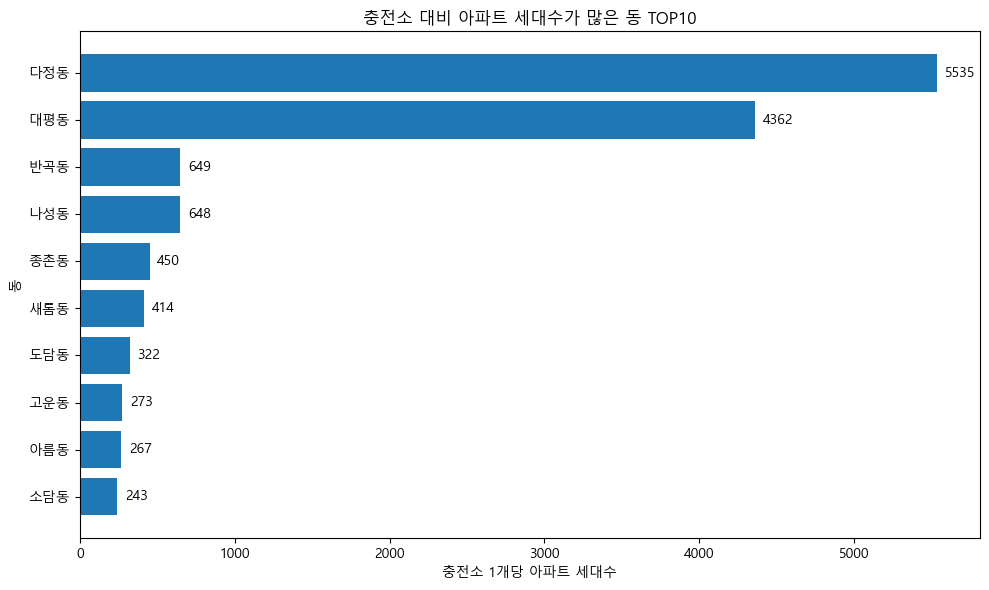

In [23]:
# 아파트 기준 TOP10 다시 정렬 (아래로 갈수록 부족한 동)
top_apt_plot = top_apt.sort_values('apt_per_charger', ascending=True)

plt.figure(figsize=(10, 6))  # 가로세로 좀 크게
plt.barh(top_apt_plot['dong'], top_apt_plot['apt_per_charger'])

plt.xlabel('충전소 1개당 아파트 세대수')
plt.ylabel('동')
plt.title('충전소 대비 아파트 세대수가 많은 동 TOP10')

# 막대 옆에 숫자 표시 (선택)
for i, v in enumerate(top_apt_plot['apt_per_charger']):
    plt.text(v + 50, i, f'{v:.0f}', va='center')

plt.tight_layout()
plt.show()


Text(0.5, 1.0, '세종시 동별 전기차 충전소 대비 아파트 세대수 TOP10')

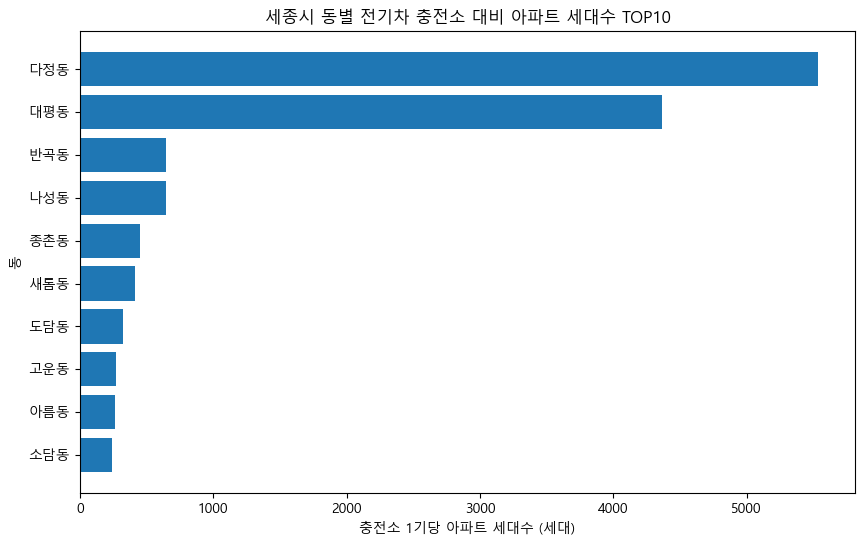

In [24]:
plt.figure(figsize=(10, 6))
plt.barh(top_apt_plot['dong'], top_apt_plot['apt_per_charger'])

plt.xlabel('충전소 1기당 아파트 세대수 (세대)')
plt.ylabel('동')
plt.title('세종시 동별 전기차 충전소 대비 아파트 세대수 TOP10')

# 가장 부족한 동을 강조 (예: 다정동, 대평동만 색 다르게)


In [25]:
priority_dongs = list(top_apt['dong'])  # 아파트 기준 TOP10
if '해밀동' not in priority_dongs:
    priority_dongs.append('해밀동')     # 충전소 0개 동 추가

priority_dongs

['다정동', '대평동', '반곡동', '나성동', '종촌동', '새롬동', '도담동', '고운동', '아름동', '소담동', '해밀동']

In [26]:
import pandas as pd

# lat/lng 를 숫자로 다시 강제 변환 + NaN 제거
charging_sejong['lat'] = pd.to_numeric(charging_sejong['lat'], errors='coerce')
charging_sejong['lng'] = pd.to_numeric(charging_sejong['lng'], errors='coerce')

print("정제 전 행 개수 :", len(charging_sejong))
print(charging_sejong[['lat', 'lng']].isna().sum())

charging_sejong = charging_sejong.dropna(subset=['lat', 'lng'])

print("정제 후 행 개수 :", len(charging_sejong))
print(charging_sejong[['lat', 'lng']].isna().sum())


정제 전 행 개수 : 4639
lat    48
lng    48
dtype: int64
정제 후 행 개수 : 4591
lat    0
lng    0
dtype: int64


In [27]:
import folium

center_lat = charging_sejong['lat'].mean()
center_lng = charging_sejong['lng'].mean()

m = folium.Map(location=[center_lat, center_lng], zoom_start=12)

for _, row in charging_sejong.iterrows():
    dong_name = row['dong']

    # 우선 대상 동이면 빨간색, 아니면 파란색
    color = 'red' if dong_name in priority_dongs else 'blue'

    html = f"""
    <div style="font-size:14px;">
        <b>{row['충전소명']}</b><br>
        동: {dong_name}<br>
        주소: {row['주소']}
    </div>
    """

    popup = folium.Popup(html, max_width=250)

    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=popup,
        tooltip=row['주소'],
        icon=folium.Icon(color=color, icon="bolt")
    ).add_to(m)

m


In [28]:
import os

# results 폴더 없으면 생성
os.makedirs('results', exist_ok=True)

m.save('results/sejong_ev_priority_map.html')


In [29]:
m.save('results/sejong_ev_priority_map.html')


In [30]:
summary_sorted = summary.sort_values('apt_per_charger', ascending=False)

summary_sorted.to_csv('results/세종시_충전소_부족도_요약.csv', index=False)
top_apt.to_csv('results/세종시_아파트기준_우선동_TOP10.csv', index=False)
no_charger.to_csv('results/세종시_충전소없는동.csv', index=False)


In [31]:
import os
os.startfile(os.getcwd())

In [32]:
os.getcwd()

'C:\\Users\\jeong\\T-SUM 팀'